## 90800 - EDA and Viz with Python
#### Group Project
##### Members: 
##### Aarushi Jaitly - ajaitly@andrew.cmu.edu | Farrukh Masood - fmasood@andrew.cmu.edu 
##### Garrett Kent - gkent@andrew.cmu.edu | Nishan Sah - nsah@andrew.cmu.edu

### Migration Trends: Missing Migrants and Implications of Politics in Migration

The increase in globalization and crisis across the world has brought about increase in migration across the world. Migrants often die or go missing in their endeavor, and this has been a major concern of the entire world. With that in mind, we built a project to understand the gravity of the problem. We wanted to understand where migrants go missing and how has the United States responded to immigration across the years. The United States has had varying stances on immigration in different presidential terms, so we wanted to see if there was any significant change in responses.

For our study, we retrieved data from two main sources. The first source was the [missing migrant data](https://missingmigrants.iom.int/downloads) from the International Organization for Migration and the second was the [immigration statistics](https://ohss.dhs.gov/topics/immigration/yearbook-immigration-statistics/yearbook-2023) from the Office of Homeland Security Statistics (OHSS), the U.S. Department of Homeland Security. We then cleaned the excel files in order to conduct our analysis.

Our project serves to answer the following questions:


* How do migrant missings and deaths differ based on region, place of origin, and route
* How do the causes of migrant death differ by region, place of origin, and route?
* Where do migrants often go missing? How does that look with regard to the United States?
* Did missing migrant trends look different in the US during the first Trump administration?
* How did this compare to the rest of the world during that administration?
* How have the immigration trends in the US varied across the years?
* How have immigration trends changed across the last 3 administrations?
* Is there a correlation between amnesty granted by the United States and number of expulsions and apprehensions?
* Is there a correlation between amnesty granted by the United States and the number of migrants going missing en route to the US?
* Do immigration trends and missing migrant numbers change during global crisis? For reference, we used Global Economic Crisis of 2007-09 and the COVID-19 pandemic.

#### Importing Libraries
We have use pandas for data cleaning and analysis. For visualization, we are using seaborn, matplotlib and plotly. For statistical testing, we will be using stats from scipy library.

In [1]:
import pandas as pd
import numpy as np
from scipy import stats
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns

#### Wrangling the missing migrant data from the International Organization for Migration's Missing Migrants Project

In [3]:
mm = pd.read_excel('Missing_Migrants_Global_Figures_allData.xlsx', index_col=0)

In [4]:
mm.shape

(17474, 24)

In [5]:
mm.head()

,Incident ID,Incident Type,Region of Incident,Incident Date,Incident Year,Month,Number of Dead,Minimum Estimated Number of Missing,Total Number of Dead and Missing,Number of Survivors,...,Region of Origin,Cause of Death,Country of Incident,Migration Route,Location of Incident,Coordinates,UNSD Geographical Grouping,Information Source,URL,Source Quality
Main ID,,,,,,,,,,,,,,,,,,,,,
2014.MMP00001,2014.MMP00001,Incident,North America,2014-01-06,2014,January,1.0,NaN,1,NaN,...,Central America,Mixed or unknown,United States of America,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,"31.650259, -110.366453",Northern America,Pima County Office of the Medical Examiner (PC...,http://humaneborders.info/,5
2014.MMP00002,2014.MMP00002,Incident,North America,2014-01-12,2014,January,1.0,NaN,1,NaN,...,Latin America / Caribbean (P),Mixed or unknown,United States of America,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,"31.59713, -111.73756",Northern America,Pima County Office of the Medical Examiner (PC...,NaN,5
2014.MMP00003,2014.MMP00003,Incident,North America,2014-01-14,2014,January,1.0,NaN,1,NaN,...,Latin America / Caribbean (P),Mixed or unknown,United States of America,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,"31.94026, -113.01125",Northern America,Pima County Office of the Medical Examiner (PC...,NaN,5
2014.MMP00004,2014.MMP00004,Incident,North America,2014-01-16,2014,January,1.0,NaN,1,NaN,...,Central America,Violence,United States of America,US-Mexico border crossing,"near Douglas, Arizona, USA","31.506777, -109.315632",Northern America,"Ministry of Foreign Affairs Mexico, Pima Count...",http://bit.ly/1qfIw00,5
2014.MMP00005,2014.MMP00005,Incident,Europe,2014-01-16,2014,January,1.0,0.0,1,2.0,...,Northern Africa,Harsh environmental conditions / lack of adequ...,Russian Federation,NaN,Border between Russia and Estonia,"59.1551, 28",Northern Europe,EUBusiness (Agence France-Presse),http://bit.ly/1rTFTjR,1


In [10]:
mm.columns

Index(['Incident ID', 'Incident Type', 'Region of Incident', 'Incident Date',
       'Incident Year', 'Month', 'Number of Dead',
       'Minimum Estimated Number of Missing',
       'Total Number of Dead and Missing', 'Number of Survivors',
       'Number of Females', 'Number of Males', 'Number of Children',
       'Country of Origin', 'Region of Origin', 'Cause of Death',
       'Country of Incident', 'Migration Route', 'Location of Incident',
       'Coordinates', 'UNSD Geographical Grouping', 'Information Source',
       'URL', 'Source Quality'],
      dtype='object')

In [12]:
# replace "Unknown" values with NaN
mm = mm.replace("Unknown", np.nan)

np.sum(mm.isna(), axis='rows')

Incident ID                                0
Incident Type                              0
Region of Incident                         0
Incident Date                             14
Incident Year                              0
Month                                      0
Number of Dead                           850
Minimum Estimated Number of Missing    15780
Total Number of Dead and Missing           0
Number of Survivors                    14719
Number of Females                      12637
Number of Males                         6066
Number of Children                     13873
Country of Origin                       8155
Region of Origin                        2072
Cause of Death                             0
Country of Incident                        0
Migration Route                         2615
Location of Incident                       2
Coordinates                                1
UNSD Geographical Grouping                 0
Information Source                        13
URL       

In [14]:
# Remove columns with large amounts of NaN values
mm = mm.drop(columns=['Minimum Estimated Number of Missing', 'Number of Survivors', 
                      'Number of Females', 'Number of Males', 'Number of Children',
                     'Number of Dead', 'URL', 'Information Source'])

np.sum(mm.isna(), axis='rows')

Incident ID                            0
Incident Type                          0
Region of Incident                     0
Incident Date                         14
Incident Year                          0
Month                                  0
Total Number of Dead and Missing       0
Country of Origin                   8155
Region of Origin                    2072
Cause of Death                         0
Country of Incident                    0
Migration Route                     2615
Location of Incident                   2
Coordinates                            1
UNSD Geographical Grouping             0
Source Quality                         0
dtype: int64

In [16]:
# drop the 14 rows with NaN Incident Date Values
mm = mm.dropna(subset=['Incident Date'])

np.sum(mm.isna(), axis='rows')

Incident ID                            0
Incident Type                          0
Region of Incident                     0
Incident Date                          0
Incident Year                          0
Month                                  0
Total Number of Dead and Missing       0
Country of Origin                   8146
Region of Origin                    2072
Cause of Death                         0
Country of Incident                    0
Migration Route                     2611
Location of Incident                   2
Coordinates                            1
UNSD Geographical Grouping             0
Source Quality                         0
dtype: int64

In [18]:
mm.dtypes

Incident ID                         object
Incident Type                       object
Region of Incident                  object
Incident Date                       object
Incident Year                        int64
Month                               object
Total Number of Dead and Missing     int64
Country of Origin                   object
Region of Origin                    object
Cause of Death                      object
Country of Incident                 object
Migration Route                     object
Location of Incident                object
Coordinates                         object
UNSD Geographical Grouping          object
Source Quality                       int64
dtype: object

In [20]:
# convert incident date to date format
mm['Incident Date'] = pd.to_datetime(mm['Incident Date'])
mm.dtypes

Incident ID                                 object
Incident Type                               object
Region of Incident                          object
Incident Date                       datetime64[ns]
Incident Year                                int64
Month                                       object
Total Number of Dead and Missing             int64
Country of Origin                           object
Region of Origin                            object
Cause of Death                              object
Country of Incident                         object
Migration Route                             object
Location of Incident                        object
Coordinates                                 object
UNSD Geographical Grouping                  object
Source Quality                               int64
dtype: object

#### Visualizing the missing migrant data:

In [23]:
# view number of dead/missing by year
mm.groupby('Incident Year')['Total Number of Dead and Missing'].sum()

Incident Year
2014    5550
2015    6751
2016    8086
2017    6289
2018    5007
2019    5419
2020    4287
2021    6201
2022    7141
2023    8606
2024    5988
Name: Total Number of Dead and Missing, dtype: int64

In [25]:
data_yearly = mm.groupby('Incident Year')['Total Number of Dead and Missing'].sum()

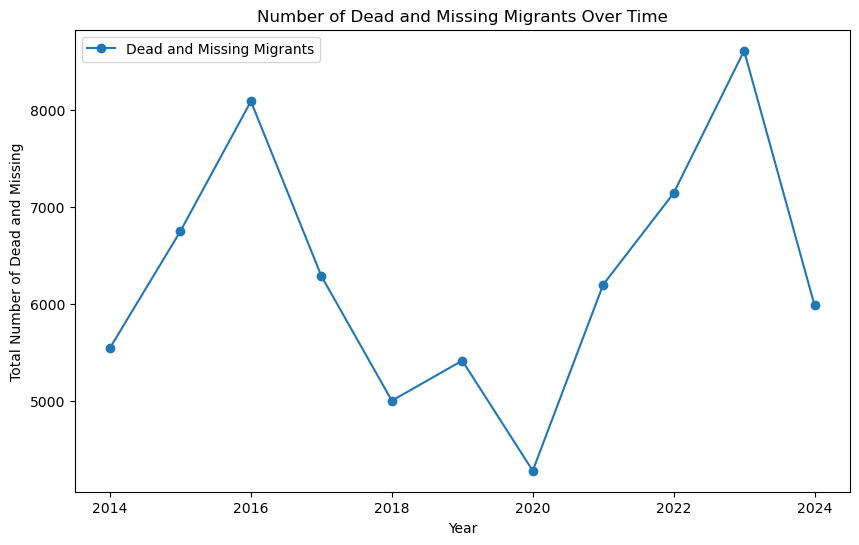

In [27]:
plt.figure(figsize=(10, 6))
plt.plot(data_yearly.index, data_yearly, marker='o', linestyle='-', label='Dead and Missing Migrants')
plt.title('Number of Dead and Missing Migrants Over Time')
plt.xlabel('Year')
plt.ylabel('Total Number of Dead and Missing')
plt.legend()

Question: Did missing migrant trends look different in the US during the first Trump administration compared to the rest of the world?

(0.0, 9000.0)

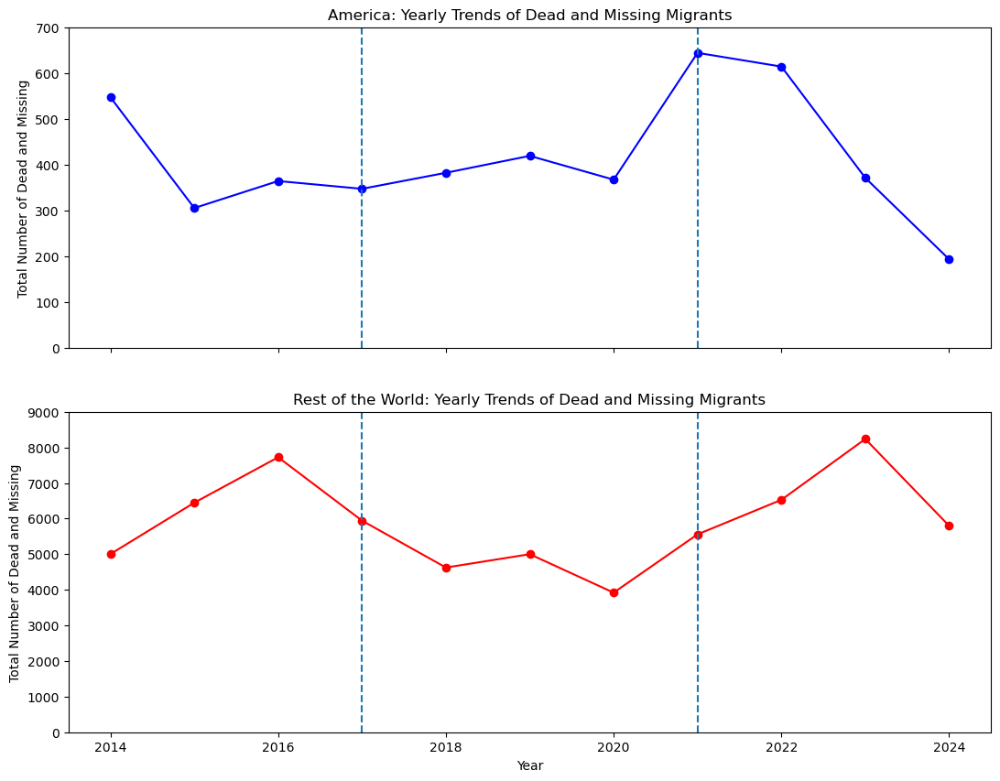

In [31]:
# seperate the US and the rest of the world
mm_america = mm[mm['Country of Incident'] == 'United States of America']
mm_other_countries = mm[mm['Country of Incident'] != 'United States of America']

# Aggregate data
yearly_america = mm_america.groupby('Incident Year')['Total Number of Dead and Missing'].sum()
yearly_other_countries = mm_other_countries.groupby('Incident Year')['Total Number of Dead and Missing'].sum()

fig, axes = plt.subplots(2, 1, figsize=(13, 10), sharex=True)

# Plot US
axes[0].plot(yearly_america.index, yearly_america, marker='o', linestyle='-', color='blue')
axes[0].set_title('America: Yearly Trends of Dead and Missing Migrants')
axes[0].set_ylabel('Total Number of Dead and Missing')
axes[0].axvline(2017, linestyle='--')
axes[0].axvline(2021, linestyle='--')
axes[0].set_ylim(0, 700)

# Plot Rest of the World
axes[1].plot(yearly_other_countries.index, yearly_other_countries, marker='o', linestyle='-', color='red')
axes[1].set_title('Rest of the World: Yearly Trends of Dead and Missing Migrants')
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Total Number of Dead and Missing')
axes[1].axvline(2017, linestyle='--')
axes[1].axvline(2021, linestyle='--')
axes[1].set_ylim(0, 9000)

In [33]:
# compare missing migration changes in the US and the rest of the world in a table

yearly_comparison = pd.DataFrame({
    'America': yearly_america,
    'Rest of the World': yearly_other_countries
})

# Calculate year-over-year absolute changes
yearly_comparison['America Change'] = yearly_comparison['America'].diff()
yearly_comparison['Rest of the World Change'] = yearly_comparison['Rest of the World'].diff()

# Calculate year-over-year percentage changes
yearly_comparison['America % Change'] = (yearly_comparison['America Change'] / yearly_comparison['America'].shift(1) * 100).round()
yearly_comparison['Rest of the World % Change'] = (yearly_comparison['Rest of the World Change'] / yearly_comparison['Rest of the World'].shift(1) * 100).round()

yearly_comparison

yearly_comparison.drop(2014, inplace=True)

yearly_comparison['America % Change'] = yearly_comparison['America % Change'].apply(lambda x: str(int(x)) + '%')

yearly_comparison['Rest of the World % Change'] = yearly_comparison['Rest of the World % Change'].apply(lambda x: str(int(x)) + '%')

# Display the table
yearly_comparison

# references: 
# OpenAI. (2024). ChatGPT (Dec 7 version) [Large language model]. 
#    https://chat.openai.com/chat

,America,Rest of the World,America Change,Rest of the World Change,America % Change,Rest of the World % Change
Incident Year,,,,,,
2015,305,6446,-242.0,1443.0,-44%,29%
2016,364,7722,59.0,1276.0,19%,20%
2017,347,5942,-17.0,-1780.0,-5%,-23%
2018,382,4625,35.0,-1317.0,10%,-22%
2019,419,5000,37.0,375.0,10%,8%
2020,367,3920,-52.0,-1080.0,-12%,-22%
2021,644,5557,277.0,1637.0,75%,42%
2022,614,6527,-30.0,970.0,-5%,17%
2023,371,8235,-243.0,1708.0,-40%,26%


In [35]:
# how does this change look when viewed month-to-month?

In [37]:
# create a new column containing just the month and year from the incident date
mm['month_year'] = mm['Incident Date'].dt.strftime('%Y-%m')
mm['month_year'] = pd.to_datetime(mm['month_year'], format='%Y-%m')

In [39]:
mm.head()

,Incident ID,Incident Type,Region of Incident,Incident Date,Incident Year,Month,Total Number of Dead and Missing,Country of Origin,Region of Origin,Cause of Death,Country of Incident,Migration Route,Location of Incident,Coordinates,UNSD Geographical Grouping,Source Quality,month_year
Main ID,,,,,,,,,,,,,,,,,
2014.MMP00001,2014.MMP00001,Incident,North America,2014-01-06,2014,January,1,Guatemala,Central America,Mixed or unknown,United States of America,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,"31.650259, -110.366453",Northern America,5,2014-01-01
2014.MMP00002,2014.MMP00002,Incident,North America,2014-01-12,2014,January,1,NaN,Latin America / Caribbean (P),Mixed or unknown,United States of America,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,"31.59713, -111.73756",Northern America,5,2014-01-01
2014.MMP00003,2014.MMP00003,Incident,North America,2014-01-14,2014,January,1,NaN,Latin America / Caribbean (P),Mixed or unknown,United States of America,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,"31.94026, -113.01125",Northern America,5,2014-01-01
2014.MMP00004,2014.MMP00004,Incident,North America,2014-01-16,2014,January,1,Mexico,Central America,Violence,United States of America,US-Mexico border crossing,"near Douglas, Arizona, USA","31.506777, -109.315632",Northern America,5,2014-01-01
2014.MMP00005,2014.MMP00005,Incident,Europe,2014-01-16,2014,January,1,Sudan,Northern Africa,Harsh environmental conditions / lack of adequ...,Russian Federation,NaN,Border between Russia and Estonia,"59.1551, 28",Northern Europe,1,2014-01-01


In [41]:
mm.dtypes

Incident ID                                 object
Incident Type                               object
Region of Incident                          object
Incident Date                       datetime64[ns]
Incident Year                                int64
Month                                       object
Total Number of Dead and Missing             int64
Country of Origin                           object
Region of Origin                            object
Cause of Death                              object
Country of Incident                         object
Migration Route                             object
Location of Incident                        object
Coordinates                                 object
UNSD Geographical Grouping                  object
Source Quality                               int64
month_year                          datetime64[ns]
dtype: object

(0.0, 1750.0)

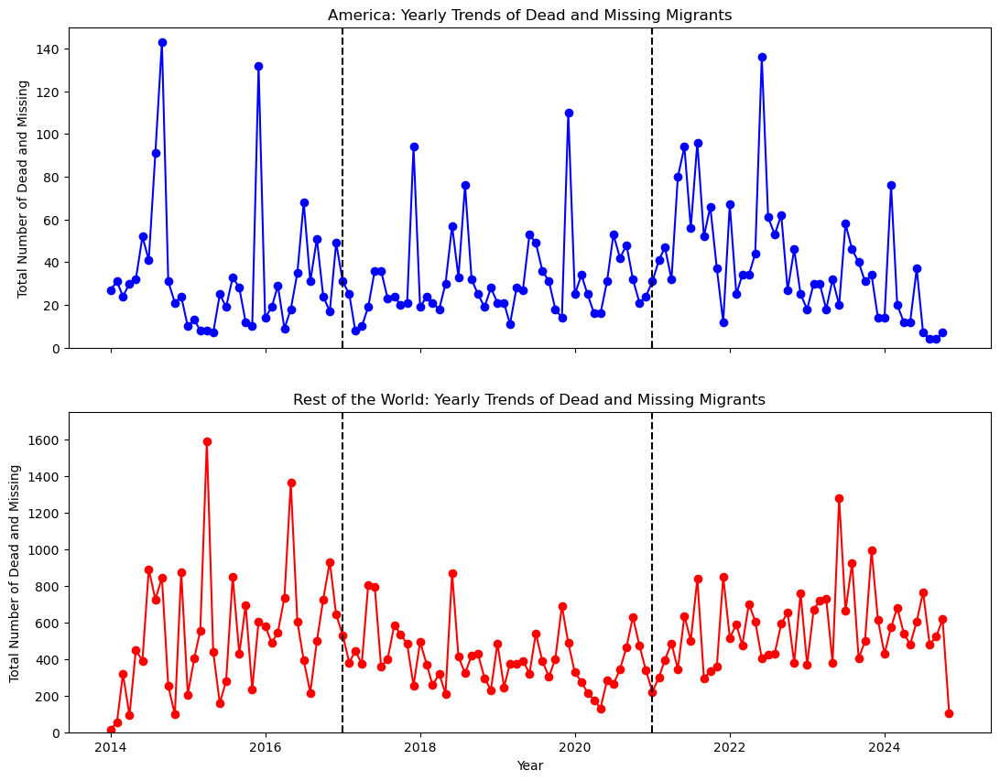

In [43]:
# Filter data: US and Other Countries
mm_america = mm[mm['Country of Incident'] == 'United States of America']
mm_other_countries = mm[mm['Country of Incident'] != 'United States of America']

# Create lines during Trump administration
vertical_line_1 = pd.to_datetime('2017-01-01')
vertical_line_2 = pd.to_datetime('2021-01-01')


# Aggregate data
yearly_america = mm_america.groupby('month_year')['Total Number of Dead and Missing'].sum()
yearly_other_countries = mm_other_countries.groupby('month_year')['Total Number of Dead and Missing'].sum()

fig, axes = plt.subplots(2, 1, figsize=(13, 10), sharex=True)

# Plot US
axes[0].plot(yearly_america.index, yearly_america, marker='o', linestyle='-', color='blue')
axes[0].set_title('America: Yearly Trends of Dead and Missing Migrants')
axes[0].set_ylabel('Total Number of Dead and Missing')
axes[0].axvline(vertical_line_1, color='black', linestyle='--')
axes[0].axvline(vertical_line_2, color='black', linestyle='--')
axes[0].set_ylim(0, 150)

# Plot Rest of the World
axes[1].plot(yearly_other_countries.index, yearly_other_countries, marker='o', linestyle='-', color='red')
axes[1].set_title('Rest of the World: Yearly Trends of Dead and Missing Migrants')
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Total Number of Dead and Missing')
axes[1].axvline(vertical_line_1, color='black', linestyle='--')
axes[1].axvline(vertical_line_2, color='black', linestyle='--')
axes[1].set_ylim(0, 1750)

Question: how do migrant missing/deaths differ based on region?

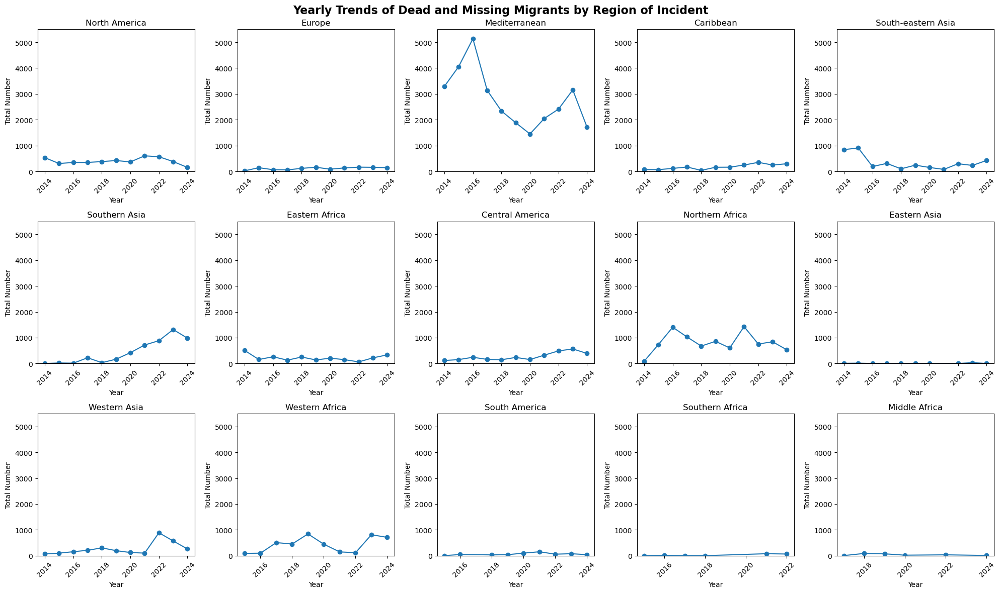

In [47]:
# Exclude "Central Asia" because of very little data
filtered_regions = [region for region in mm['Region of Incident'].unique() if region != "Central Asia"]
region_data = {}

for region in filtered_regions:
    region_subset = mm[mm['Region of Incident'] == region]
    region_aggregated = region_subset.groupby('Incident Year')['Total Number of Dead and Missing'].sum()
    region_data[region] = region_aggregated

# Create a grid of subplots (5 columns, 3 rows)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(20, 12))

# Flatten axes for easy iteration
axes = axes.flatten()



# Plot each region
for ax, (region, data) in zip(axes, region_data.items()):
    ax.plot(data.index, data, marker='o', linestyle='-', label=region)
    ax.set_title(region, fontsize=12)
    ax.set_ylabel('Total Number')
    ax.set_xlabel('Year')
    ax.set_ylim(0, 5500)
    ax.tick_params(axis='x', rotation=45)

# Hide any extra empty subplots
for ax in axes[len(region_data):]:
    ax.set_visible(False)

fig.suptitle('Yearly Trends of Dead and Missing Migrants by Region of Incident', fontsize=16, fontweight='bold')

plt.tight_layout()

# references: 
# OpenAI. (2024). ChatGPT (Dec 7 version) [Large language model]. 
#    https://chat.openai.com/chat

In [49]:
mm.groupby('Region of Incident')['Total Number of Dead and Missing'].sum().sort_values(ascending=False)

Region of Incident
Mediterranean         30616
Northern Africa        8959
Southern Asia          4784
North America          4401
Western Africa         4208
South-eastern Asia     3768
Central America        2975
Western Asia           2958
Eastern Africa         2426
Caribbean              1927
Europe                 1253
South America           539
Middle Africa           222
Southern Africa         161
Eastern Asia             76
Central Asia             52
Name: Total Number of Dead and Missing, dtype: int64

Question: are migrants coming from certain places (regions of origin) more likely to go missing?

In [53]:
np.sum(mm.isna(), axis='rows')

Incident ID                            0
Incident Type                          0
Region of Incident                     0
Incident Date                          0
Incident Year                          0
Month                                  0
Total Number of Dead and Missing       0
Country of Origin                   8146
Region of Origin                    2072
Cause of Death                         0
Country of Incident                    0
Migration Route                     2611
Location of Incident                   2
Coordinates                            1
UNSD Geographical Grouping             0
Source Quality                         0
month_year                             0
dtype: int64

In [55]:
mm_origin = mm.dropna(subset=['Region of Origin'])

mm_origin['Region of Origin'].unique()

array(['Central America', 'Latin America / Caribbean (P)',
       'Northern Africa', 'Southern Asia', 'Caribbean',
       'South-eastern Asia', 'Eastern Africa', 'Europe', 'South America',
       'Western Asia', 'Middle Africa', 'Eastern Asia',
       'Sub-Saharan Africa (P)', 'Western Africa', 'Mixed',
       'Western / Southern Asia (P)', 'Eastern Africa (P)',
       'Western / Southern Asia', 'Eastern Asia (P)',
       'Western Africa (P)', 'Sub-Saharan Africa', 'Oceania',
       'Central Asia', 'Southern Asia (P)', 'Northern Africa (P)',
       'Southern Africa', 'Caribbean (P)', 'Western Asia (P)',
       'South America (P)', 'Central America (P)',
       'South-eastern Asia (P)', 'Northern America', 'Middle Africa (P)'],
      dtype=object)

In [57]:
mm_origin['Region of Origin'] = mm_origin['Region of Origin'].str.replace(r' \(\w\)', '', regex=True)

mm_origin['Region of Origin'].unique()

/var/folders/rh/q207pdgs6yb7w22z3345kbtc0000gn/T/ipykernel_22888/3291360250.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mm_origin['Region of Origin'] = mm_origin['Region of Origin'].str.replace(r' \(\w\)', '', regex=True)


array(['Central America', 'Latin America / Caribbean', 'Northern Africa',
       'Southern Asia', 'Caribbean', 'South-eastern Asia',
       'Eastern Africa', 'Europe', 'South America', 'Western Asia',
       'Middle Africa', 'Eastern Asia', 'Sub-Saharan Africa',
       'Western Africa', 'Mixed', 'Western / Southern Asia', 'Oceania',
       'Central Asia', 'Southern Africa', 'Northern America'],
      dtype=object)

In [59]:
mm_origin['Region of Origin'].nunique()

20

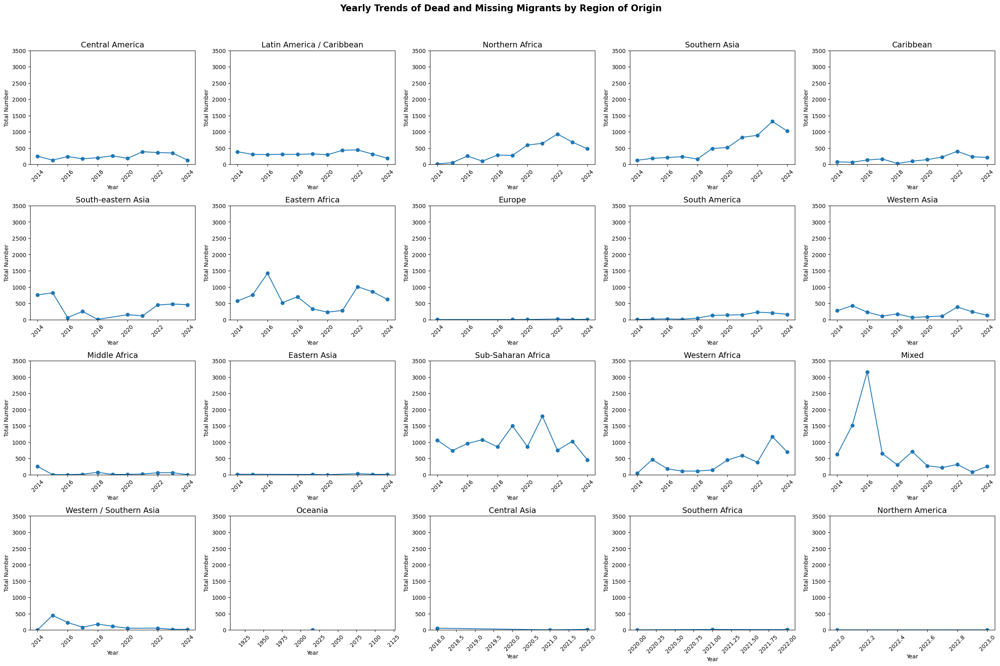

In [61]:
filtered_regions = [region for region in mm_origin['Region of Origin'].unique()]


region_data = {}

# Aggregate data for each region of origin
for region in filtered_regions:
    region_subset = mm_origin[mm_origin['Region of Origin'] == region]
    region_aggregated = region_subset.groupby('Incident Year')['Total Number of Dead and Missing'].sum()
    region_data[region] = region_aggregated

# Create a grid of subplots (5 rows x 5 columns)
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(25, 20))

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot each region
for ax, (region, data) in zip(axes, region_data.items()):
    ax.plot(data.index, data, marker='o', linestyle='-', label=region)
    ax.set_title(region, fontsize=14)
    ax.set_ylabel('Total Number')
    ax.set_xlabel('Year')
    ax.set_ylim(0, 3500)
    ax.tick_params(axis='x', rotation=45)

# Hide any extra empty subplots
for ax in axes[len(region_data):]:
    ax.set_visible(False)

# Add overarching title
fig.suptitle('Yearly Trends of Dead and Missing Migrants by Region of Origin', fontsize=16, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])

In [63]:
mm_origin.groupby('Region of Origin')['Total Number of Dead and Missing'].sum().sort_values(ascending=False)

Region of Origin
Sub-Saharan Africa           11091
Mixed                         8118
Eastern Africa                7287
Southern Asia                 6008
Western Africa                4357
Northern Africa               4332
Latin America / Caribbean     3629
South-eastern Asia            3545
Central America               2692
Western Asia                  2226
Caribbean                     1807
Western / Southern Asia       1183
South America                 1102
Middle Africa                  519
Eastern Asia                    95
Central Asia                    68
Europe                          32
Southern Africa                 22
Northern America                 4
Oceania                          1
Name: Total Number of Dead and Missing, dtype: int64

Question: Are migrants using certain migration routes more likely to go missing?

In [67]:
mm_route = mm.dropna(subset=['Migration Route'])

mm_route['Migration Route'].unique()

array(['US-Mexico border crossing', 'Eastern Mediterranean',
       'English Channel to the UK', 'Caribbean to US',
       'Western Mediterranean', 'Central Mediterranean',
       'Haiti to Dominican Republic', 'Eastern Route to/from EHOA',
       'Route to Southern Africa', 'Sahara Desert crossing',
       'Western Africa / Atlantic route to the Canary Islands',
       'Syria to Türkiye', 'Western Balkans', 'Türkiye-Europe land route',
       'Dominican Republic to Puerto Rico', 'Northern Route from EHOA',
       'Sea crossings to Mayotte', 'Darien', 'Afghanistan to Iran',
       'Venezuela to Caribbean', 'Horn of Africa Route',
       'Iran to Türkiye', 'Italy to France', 'DRC to Uganda',
       'Belarus-EU border', 'Ukraine to Europe',
       'Caribbean to Central America'], dtype=object)

In [69]:
mm_route['Migration Route'].nunique()

27

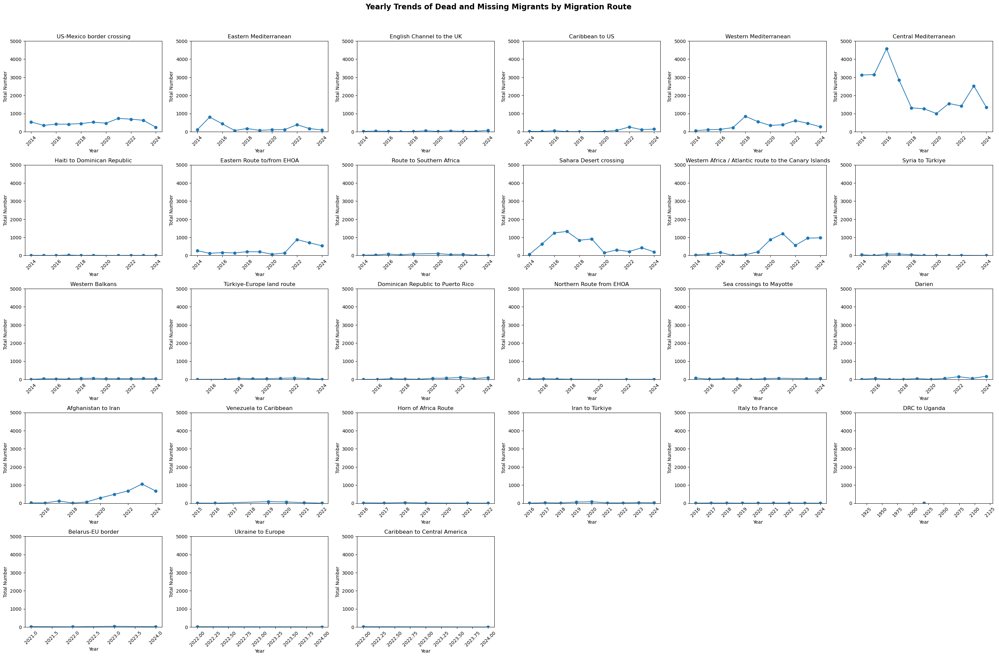

In [71]:
filtered_routes = [route for route in mm_route['Migration Route'].unique()]

route_data = {}

# Aggregate data for each migration route
for route in filtered_routes:
    route_subset = mm_route[mm_route['Migration Route'] == route]
    route_aggregated = route_subset.groupby('Incident Year')['Total Number of Dead and Missing'].sum()
    route_data[route] = route_aggregated

# Create a grid of subplots (5 rows x 6 columns)
fig, axes = plt.subplots(nrows=5, ncols=6, figsize=(30, 20))

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot each migration route
for ax, (route, data) in zip(axes, route_data.items()):
    ax.plot(data.index, data, marker='o', linestyle='-', label=route)
    ax.set_title(route, fontsize=12)
    ax.set_ylabel('Total Number')
    ax.set_xlabel('Year')
    ax.set_ylim(0, 5000)  # Adjust as needed
    ax.tick_params(axis='x', rotation=45)

# Hide any extra empty subplots
for ax in axes[len(route_data):]:
    ax.set_visible(False)

# Add overarching title
fig.suptitle('Yearly Trends of Dead and Missing Migrants by Migration Route', fontsize=16, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])

In [73]:
mm_route.groupby('Migration Route')['Total Number of Dead and Missing'].sum().sort_values(ascending=False)

Migration Route
Central Mediterranean                                    24121
Sahara Desert crossing                                    6335
US-Mexico border crossing                                 5439
Western Africa / Atlantic route to the Canary Islands     5101
Western Mediterranean                                     3981
Eastern Route to/from EHOA                                3434
Afghanistan to Iran                                       3416
Eastern Mediterranean                                     2513
Caribbean to US                                            681
Darien                                                     537
Route to Southern Africa                                   482
Dominican Republic to Puerto Rico                          423
Western Balkans                                            398
Sea crossings to Mayotte                                   331
English Channel to the UK                                  312
Türkiye-Europe land route              

Question: How do causes of death differ by region, country, place of origin, and route?

In [77]:
mm['Cause of Death'].unique()

array(['Mixed or unknown', 'Violence',
       'Harsh environmental conditions / lack of adequate shelter, food, water',
       'Drowning',
       'Vehicle accident / death linked to hazardous transport',
       'Sickness / lack of access to adequate healthcare',
       'Accidental death'], dtype=object)

In [79]:
mm['Cause of Death'].value_counts()

Cause of Death
Drowning                                                                  4418
Mixed or unknown                                                          3643
Vehicle accident / death linked to hazardous transport                    2915
Sickness / lack of access to adequate healthcare                          2036
Harsh environmental conditions / lack of adequate shelter, food, water    1850
Violence                                                                  1793
Accidental death                                                           805
Name: count, dtype: int64

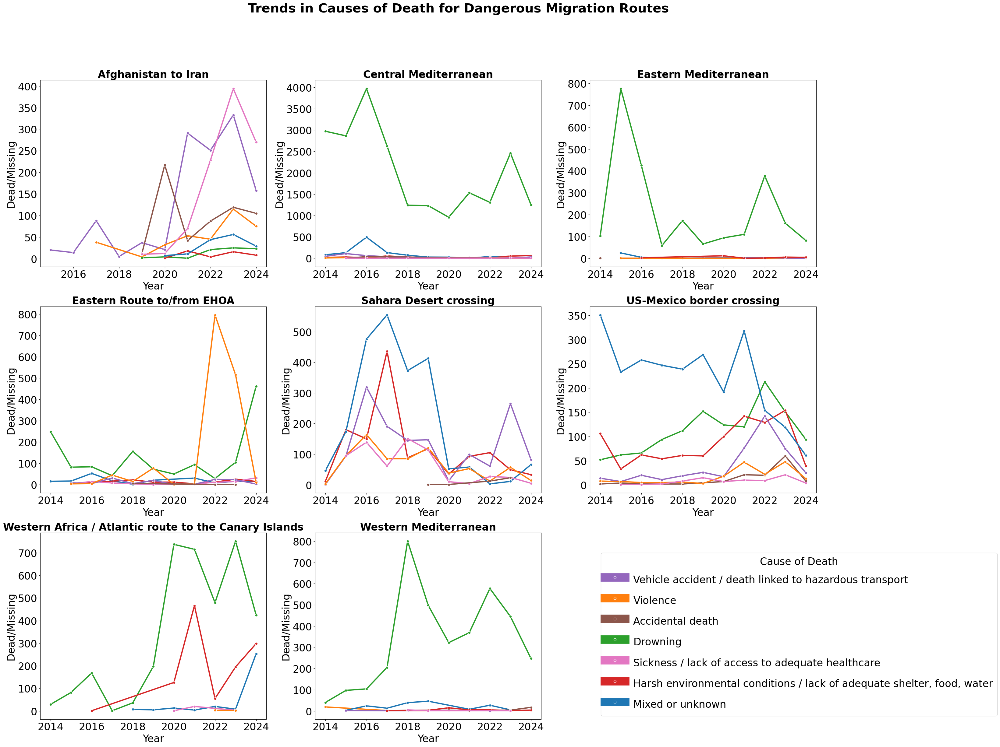

In [81]:
# Step 1: Filter the most dangerous migration routes
dangerous_routes = (
    mm_route.groupby('Migration Route')['Total Number of Dead and Missing']
    .sum()
    .loc[lambda x: x > 2000]  # Keep only routes with > 2000 deaths/missing
    .index
)

# Filter the dataset for these routes
mm_dangerous = mm_route[mm_route['Migration Route'].isin(dangerous_routes)]

# Step 2: Group data by Incident Year and Cause of Death for each route
grouped_data = (
    mm_dangerous.groupby(['Migration Route', 'Incident Year', 'Cause of Death'])['Total Number of Dead and Missing']
    .sum()
    .reset_index()
)

# Step 3: Define a consistent color palette for 'Cause of Death'
unique_causes = mm_dangerous['Cause of Death'].unique()
palette = sns.color_palette("tab10", len(unique_causes))  # Use tab10 or another palette
cause_palette = {cause: palette[i] for i, cause in enumerate(unique_causes)}

# Step 4: Create grid layout
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(30, 25))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Step 5: Plot data for each route
for ax, route in zip(axes, dangerous_routes):
    # Filter grouped data for the specific route
    route_data = grouped_data[grouped_data['Migration Route'] == route]
        
    sns.lineplot(
        data=route_data,
        x='Incident Year',
        y='Total Number of Dead and Missing',
        hue='Cause of Death',  # Different lines for each cause
        palette=cause_palette,  # Apply consistent palette
        marker='o',
        ax=ax,
        errorbar=None,  # Remove confidence interval
        linewidth=3  # Adjust line width
    )
    ax.set_title(f'{route}', fontweight='bold', fontsize=24)
    ax.set_xlabel('Year', fontsize=24)  # Explicitly set x-axis label font size
    ax.set_ylabel('Dead/Missing', fontsize=24)  # Explicitly set y-axis label font size
    ax.tick_params(axis='x', labelsize=24)  # Set x-axis tick label size
    ax.tick_params(axis='y', labelsize=24)  # Set y-axis tick label size
    
    # Remove legends from individual subplots
    ax.get_legend().remove()

# Step 6: Add a single legend to the side
handles, labels = axes[0].get_legend_handles_labels()

for handle in handles:
    handle.set_linewidth(20)

fig.legend(
    handles,
    labels,
    loc='center left',
    bbox_to_anchor=(0.65, 0.15),  # Adjust horizontal and vertical placement
    title='Cause of Death',
    frameon=True,  # Add a box around the legend for clarity
    handleheight=2,  # Increase vertical space between legend items
    fontsize=24,
    title_fontsize=24
)
    
# Hide any unused subplots
for ax in axes[len(dangerous_routes):]:
    ax.set_visible(False)

# Add overarching title
fig.suptitle('Trends in Causes of Death for Dangerous Migration Routes', fontsize=30, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 0.9, 0.92])  # Leave space for the legend on the side

# references: 
# OpenAI. (2024). ChatGPT (Dec 7 version) [Large language model]. 
#    https://chat.openai.com/chat

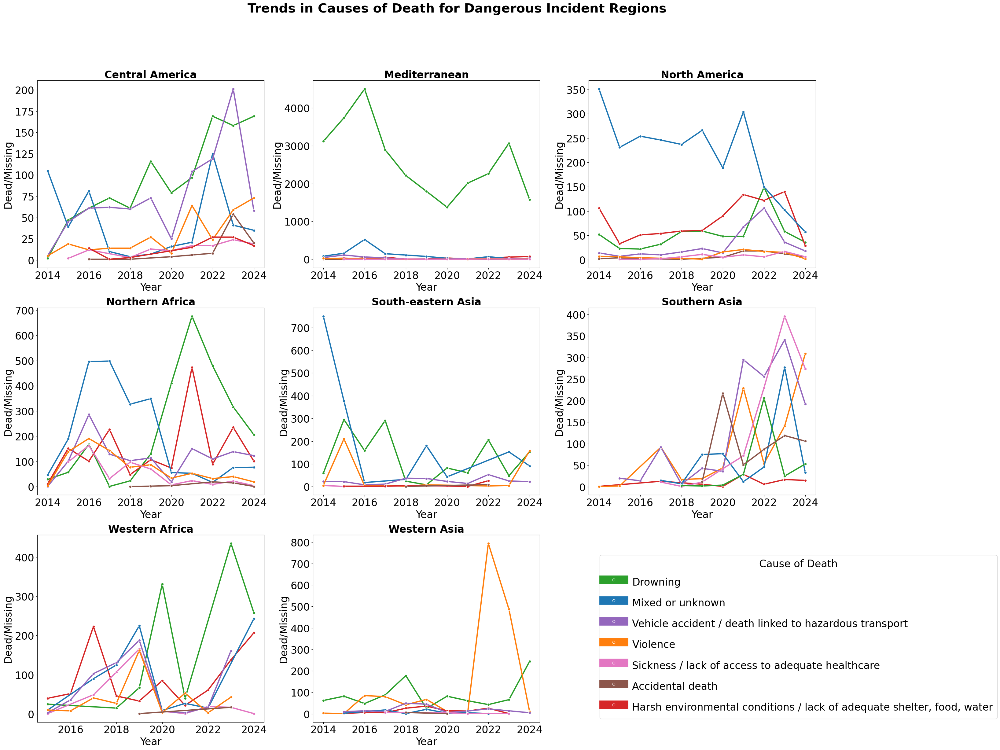

In [83]:
# Step 1: Filter the most dangerous incident regions
dangerous_regions = (
    mm.groupby('Region of Incident')['Total Number of Dead and Missing']
    .sum()
    .loc[lambda x: x > 2500]  # Keep only regions with > 2500 deaths/missing
    .index
)

# Filter the dataset for these regions
mm_dangerous = mm[mm['Region of Incident'].isin(dangerous_regions)]

# Step 2: Group data by Incident Year and Cause of Death for each region
grouped_data = (
    mm_dangerous.groupby(['Region of Incident', 'Incident Year', 'Cause of Death'])['Total Number of Dead and Missing']
    .sum()
    .reset_index()
)
# Step 4: Create grid layout
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(30, 25))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Step 5: Plot data for each region
for ax, region in zip(axes, dangerous_regions):
    # Filter grouped data for the specific region
    region_data = grouped_data[grouped_data['Region of Incident'] == region]
    
    sns.lineplot(
        data=region_data,
        x='Incident Year',
        y='Total Number of Dead and Missing',
        hue='Cause of Death',  # Different lines for each cause
        palette=cause_palette,  # Apply consistent palette
        marker='o',
        ax=ax,
        errorbar=None,  # Remove confidence interval
        linewidth=3  # Adjust line width
    )
    ax.set_title(f'{region}', fontweight='bold', fontsize=24)
    ax.set_xlabel('Year', fontsize=24)  # Explicitly set x-axis label font size
    ax.set_ylabel('Dead/Missing', fontsize=24)  # Explicitly set y-axis label font size
    ax.tick_params(axis='x', labelsize=24)  # Set x-axis tick label size
    ax.tick_params(axis='y', labelsize=24)  # Set y-axis tick label size
    
    # Remove legends from individual subplots
    ax.get_legend().remove()

# Step 6: Add a single legend to the side
handles, labels = axes[0].get_legend_handles_labels()

for handle in handles:
    handle.set_linewidth(20)

fig.legend(
    handles,
    labels,
    loc='center left',
    bbox_to_anchor=(0.65, 0.15),  # Adjust horizontal and vertical placement
    title='Cause of Death',
    frameon=True,  # Add a box around the legend for clarity
    handleheight=2,  # Increase vertical space between legend items
    fontsize=24,
    title_fontsize=24
)
    
# Hide any unused subplots
for ax in axes[len(dangerous_regions):]:
    ax.set_visible(False)

# Add overarching title
fig.suptitle('Trends in Causes of Death for Dangerous Incident Regions', fontsize=30, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 0.9, 0.92])  # Leave space for the legend on the side

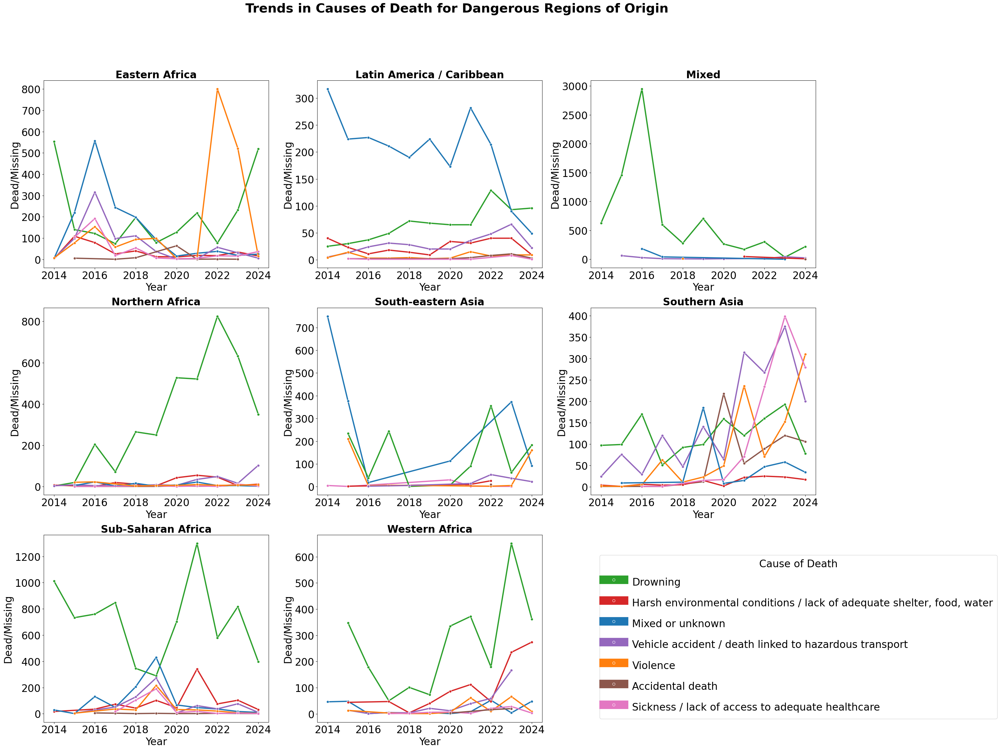

In [76]:
# Step 1: Filter the most dangerous regions of origin
dangerous_origins = (
    mm_origin.groupby('Region of Origin')['Total Number of Dead and Missing']
    .sum()
    .loc[lambda x: x > 3500]  # Keep only regions of origin with > 3500 deaths/missing
    .index
)

# Filter the dataset for these regions
mm_dangerous_origins = mm_origin[mm_origin['Region of Origin'].isin(dangerous_origins)]

# Step 2: Group data by Incident Year and Cause of Death for each region of origin
grouped_data_origins = (
    mm_dangerous_origins.groupby(['Region of Origin', 'Incident Year', 'Cause of Death'])['Total Number of Dead and Missing']
    .sum()
    .reset_index()
)

# Step 4: Create grid layout
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(30, 25))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Step 5: Plot data for each region of origin
for ax, origin in zip(axes, dangerous_origins):
    # Filter grouped data for the specific region of origin
    origin_data = grouped_data_origins[grouped_data_origins['Region of Origin'] == origin]
    
    sns.lineplot(
        data=origin_data,
        x='Incident Year',
        y='Total Number of Dead and Missing',
        hue='Cause of Death',  # Different lines for each cause
        palette=cause_palette,  # Apply consistent palette
        marker='o',
        ax=ax,
        errorbar=None,  # Remove confidence interval
        linewidth=3  # Adjust line width
    )
    ax.set_title(f'{origin}', fontweight='bold', fontsize=24)
    ax.set_xlabel('Year', fontsize=24)  # Explicitly set x-axis label font size
    ax.set_ylabel('Dead/Missing', fontsize=24)  # Explicitly set y-axis label font size
    ax.tick_params(axis='x', labelsize=24)  # Set x-axis tick label size
    ax.tick_params(axis='y', labelsize=24)  # Set y-axis tick label size
    
    # Remove legends from individual subplots
    ax.get_legend().remove()

# Step 6: Add a single legend to the side
handles, labels = axes[0].get_legend_handles_labels()

for handle in handles:
    handle.set_linewidth(20)

fig.legend(
    handles,
    labels,
    loc='center left',
    bbox_to_anchor=(0.65, 0.15),  # Adjust horizontal and vertical placement
    title='Cause of Death',
    frameon=True,  # Add a box around the legend for clarity
    handleheight=2,  # Increase vertical space between legend items
    fontsize=24,
    title_fontsize=24
)
    
# Hide any unused subplots
for ax in axes[len(dangerous_origins):]:
    ax.set_visible(False)

# Add overarching title
fig.suptitle('Trends in Causes of Death for Dangerous Regions of Origin', fontsize=30, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 0.9, 0.92])  # Leave space for the legend on the side

In [82]:
mm.groupby('Country of Incident')['Total Number of Dead and Missing'].sum().sort_values(ascending=False).head(10)

Country of Incident
Libya                         20672
United States of America       4553
Iran (Islamic Republic of)     3796
Tunisia                        3078
Morocco                        2755
Greece                         2399
Mexico                         2347
Myanmar                        2311
Algeria                        2191
Spain                          1956
Name: Total Number of Dead and Missing, dtype: int64

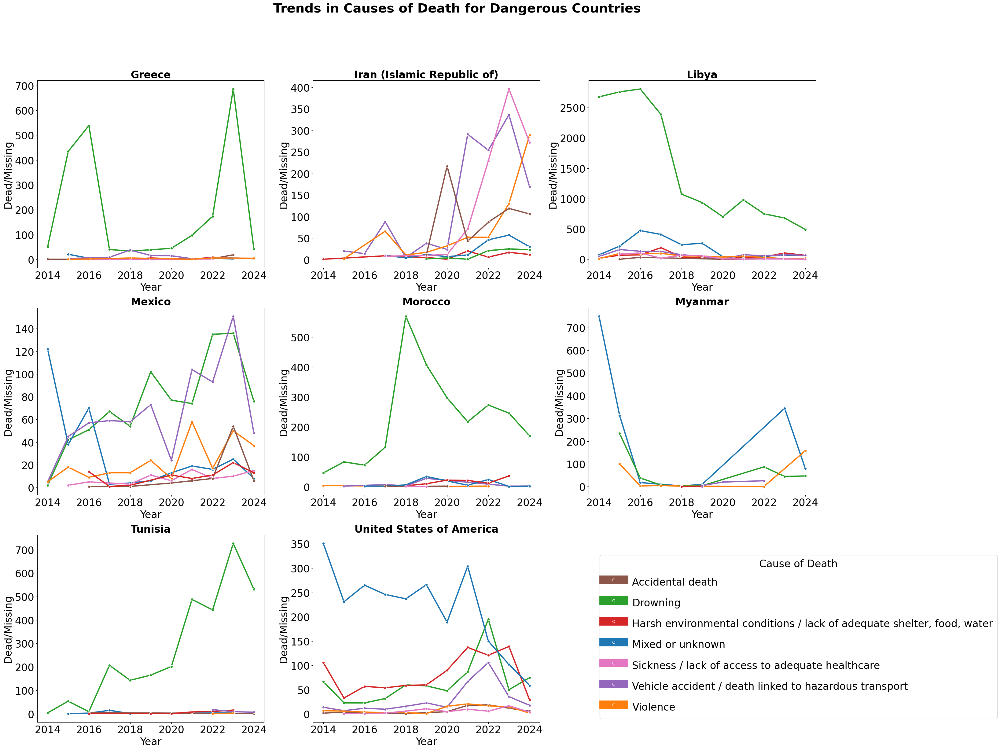

In [84]:
# Step 1: Filter the most dangerous countries of incident
dangerous_country = (
    mm.groupby('Country of Incident')['Total Number of Dead and Missing']
    .sum()
    .loc[lambda x: x > 2200]  # Keep only regions of origin with > 3500 deaths/missing
    .index
)

# Filter the dataset for these countries
mm_dangerous_country = mm[mm['Country of Incident'].isin(dangerous_country)]

# Step 2: Group data by Incident Year and Cause of Death for each country
grouped_data_country = (
    mm_dangerous_country.groupby(['Country of Incident', 'Incident Year', 'Cause of Death'])['Total Number of Dead and Missing']
    .sum()
    .reset_index()
)

# Step 4: Create grid layout
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(30, 25))

# Flatten axes array for easy iteration
axes = axes.flatten()

# Step 5: Plot data for each country
for ax, country in zip(axes, dangerous_country):
    # Filter grouped data for the specific country
    country_data = grouped_data_country[grouped_data_country['Country of Incident'] == country]
    
    sns.lineplot(
        data=country_data,
        x='Incident Year',
        y='Total Number of Dead and Missing',
        hue='Cause of Death',  # Different lines for each cause
        palette=cause_palette,  # Apply consistent palette
        marker='o',
        ax=ax,
        errorbar=None,  # Remove confidence interval
        linewidth=3  # Adjust line width
    )
    ax.set_title(f'{country}', fontweight='bold', fontsize=24)
    ax.set_xlabel('Year', fontsize=24)  # Explicitly set x-axis label font size
    ax.set_ylabel('Dead/Missing', fontsize=24)  # Explicitly set y-axis label font size
    ax.tick_params(axis='x', labelsize=24)  # Set x-axis tick label size
    ax.tick_params(axis='y', labelsize=24)  # Set y-axis tick label size
    
    # Remove legends from individual subplots
    ax.get_legend().remove()

# Step 6: Add a single legend to the side
handles, labels = axes[0].get_legend_handles_labels()

for handle in handles:
    handle.set_linewidth(20)

fig.legend(
    handles,
    labels,
    loc='center left',
    bbox_to_anchor=(0.65, 0.15),  # Adjust horizontal and vertical placement
    title='Cause of Death',
    frameon=True,  # Add a box around the legend for clarity
    handleheight=2,  # Increase vertical space between legend items
    fontsize=24,
    title_fontsize=24
)
    
# Hide any unused subplots
for ax in axes[len(dangerous_origins):]:
    ax.set_visible(False)

# Add overarching title
fig.suptitle('Trends in Causes of Death for Dangerous Countries', fontsize=30, fontweight='bold')

# Adjust layout
plt.tight_layout(rect=[0, 0, 0.9, 0.92])  # Leave space for the legend on the side
plt.show()

#### Conclusions:
* There are some differences in missing migrant patterns between the US and the rest of the world during the first Trump administration, but the differences are small
* The number of missing/dead migrants varies substantially between regions of incident, regions of origin, and migration routes, with certain areas of the world (the medditeranean, certain regions of Africa) emerging as consistently dangerous
* This number also changes differently over time for different regions, with some places having little change over time and others seeing spikes during certain years
* Cause of death also appears to vary based on geography. However, this conclusion is muddled by certain regions having high "mixed or unknown" death causes

#### Cleaning
We initiate data cleaning. Since the excel files were disorganized, we had to figure out a way to make them organized. From each of the file, we filtered the worksheet that we need and cleaned them to our use. This involved getting rid of empty and redundant rows at the top and bottom of files and extracting data. In instances where it wasn't in the format that we wanted, we also filtered and transposed to get the desired outcome. We do this for all the files retrieved from the OHSS and also filter the missing migrant data.

We start with the file containing the number of asylees let in by the US annually.

In [87]:
asyleesdf = pd.read_excel('2024_1002_ohss_yearbook_asylees_fy2023.xlsx',sheet_name='Table 16')
asyleesdf = asyleesdf.iloc[4:]
asyleesdf.columns = asyleesdf.iloc[0]
asyleesdf.reset_index(drop=True,inplace=True)
asyleesdf.set_index('Year', inplace=True)
asyleesdf = asyleesdf.iloc[1:]
asyleesdf = asyleesdf.iloc[:-2]
asyleesdf.columns = ['Asylees', 'Affirmative', 'Defensive']
asyleesdf.drop(columns = ['Affirmative', 'Defensive'], inplace = True)
asyleesdf.head()

,Asylees
Year,
1990,8470
1991,5040
1992,6310
1993,9540
1994,13830


We now retrieve and clean the file containing the number of refugees let in by the US annually.

In [89]:
refugeesdf = pd.read_excel('2024_1108_ohss_yearbook_refugees_fy2023.xlsx',sheet_name='Table 13')
refugeesdf = refugeesdf.iloc[4:]
refugeesdf.columns = refugeesdf.iloc[0]
refugeesdf.reset_index(drop=True,inplace=True)
refugeesdf.set_index('Year', inplace=True)
refugeesdf = refugeesdf.iloc[1:]
refugeesdf = refugeesdf.iloc[:-2]
refugeesdf.columns = ['Refugees']
refugeesdf.head()

,Refugees
Year,
1980,207120
1981,159250
1982,98100
1983,61220
1984,70390


Now we find and clean the file containing the number of legal nonimmigrants (who come on different visas) let in by the US annually.

In [94]:
nonimdf = pd.read_excel('2024_0906_ohss_yearbook_nonimmigrants_fy2023_0.xlsx',sheet_name='Table 25')
nonimdf = nonimdf.iloc[4:6]
nonimdf.columns = nonimdf.iloc[0]
nonimdf = nonimdf.iloc[1:]
nonimdf = nonimdf.transpose()
nonimdf.columns = nonimdf.iloc[0]
nonimdf = nonimdf.iloc[1:]
nonimdf.columns = ['Legal Nonimmigrants']
nonimdf.index.name = 'Year'
nonimdf.index = nonimdf.index.astype(int)
nonimdf = nonimdf.astype(int)
nonimdf.head()

,Legal Nonimmigrants
Year,
2014,180500000
2015,181300000
2016,178700000
2017,181100000
2018,186200000


We found the areas where migrants coming to the US go missing, and we filtered a dataframe for those places. This shall be a part of our visualization and statitistical testing.

In [100]:
mm = pd.read_excel('Missing_Migrants_Global_Figures_allData.xlsx', index_col=0)
mm.columns
usincidentareas = ['United States of America','Mexico',
                   'Panama','Cuba','Canada','Colombia','Bahamas','United States Virgin Islands','Cayman Islands',
                  'Puerto Rico']
usincidentdf = mm[mm['Country of Incident'].isin(usincidentareas)]
missingmigdf = usincidentdf.groupby('Incident Year')['Incident ID'].count().reset_index()
missingmigdf.reset_index(drop=True,inplace=True)
missingmigdf.set_index('Incident Year', inplace=True)
missingmigdf.index.name = 'Year'
missingmigdf.columns = ['Missing Migrants']
missingmigdf.head()

,Missing Migrants
Year,
2014,397
2015,261
2016,405
2017,385
2018,452


Now we build a function to read the remaining files and clean them. We find the number of naturalizations, permanent staus and enforcements (includes expulsions and apprehensions) done by the United States government.

In [102]:
def extract_sheet_data(file_path, sheet_name):
    try:
        data = pd.read_excel(file_path, sheet_name=sheet_name)
        return data

    except Exception as e:
        print(f"Error: {e}")
        return None

In [103]:
file_path = "2023_0818_plcy_yearbook_naturalizations_fy2022.xlsx_0_0.xlsx" 
sheet_name = "Table 20"       

sheet_data = extract_sheet_data(file_path, sheet_name)
df1 = sheet_data.iloc[6:]
df1 = df1.iloc[:-5]

df1.columns = [
    'Year',
    'PetitionsFiled','AcceptedPetitions',
    'Civilian',
    'Military2',
    'Not reported',
    'PetitionsDenied'
]

columns_to_drop = ['Civilian', 'Not reported','Military2']
naturalizedf = df1.drop(columns=columns_to_drop)

l=[]
for i in range (1907,2023):
    l.append(i)

naturalizedf['Year'] = l

naturalizedf.reset_index(drop=True, inplace = True)
naturalizedf.set_index('Year',inplace=True)

naturalizedf.drop(columns=['PetitionsFiled','PetitionsDenied'],inplace=True)
naturalizedf.head()

,AcceptedPetitions
Year,
1907,7941
1908,25975
1909,38374
1910,39448
1911,56683


In [111]:
file_path = "2023_0818_plcy_yearbook_enforcement_fy2022_0.xlsx" 
sheet_name = "Table 33"       

sheet_data = extract_sheet_data(file_path, sheet_name)
    
df2 = sheet_data.iloc[5:]
df2 = df2.iloc[:-8]

columns_to_remove = ['Return to Table of Contents', 'Unnamed: 2']
df_removed = df2.drop(columns=columns_to_remove)

l2 = df_removed['Unnamed: 3'].to_list()
l3 = df_removed['Unnamed: 1'].to_list()
lc = l3 + l2

lc = lc[:98]

l1925=[]
for i in range (1925,2023):
    l1925.append(i)
    
enforcedf = pd.DataFrame({
    'Year': l1925,
    'ExpulsionApprehension': lc
})

enforcedf.reset_index(drop=True, inplace = True)
enforcedf.set_index('Year',inplace=True)
enforcedf.head()

,ExpulsionApprehension
Year,
1925,22199
1926,12735
1927,16393
1928,23566
1929,32711


In [113]:
file_path = "2024_0906_ohss_yearbook_lawful_permanent_residents_fy2023_0.xlsx"  
sheet_name = "Table 1"       

sheet_data = extract_sheet_data(file_path, sheet_name)

df3 = sheet_data.iloc[5:]
df3 = df3.iloc[:-3]

a = df3['Unnamed: 1'].to_list()
b = df3['Unnamed: 2'].to_list()
c = df3['Unnamed: 3'].to_list()
d = df3['Unnamed: 4'].to_list()
e = df3['Unnamed: 5'].to_list()
f = df3['Unnamed: 6'].to_list()
g = df3['Unnamed: 7'].to_list()


#Number Obtaining PR - No_PRs
No_PRs = a + c + e + g

No_PRs = No_PRs[0:-36]

y=[]
for i in range (1820,2024):
    y.append(i)

prdf = pd.DataFrame({
    'Year': y,
    'TotalPR': No_PRs
})

prdf.reset_index(drop=True, inplace = True)
prdf.set_index('Year',inplace=True)
prdf.head()

,TotalPR
Year,
1820,8390
1821,9130
1822,6910
1823,6350
1824,7910


#### Time Series Visualization
Now we can visualize all of our dataframes as time series, showing trends by years. We use plotly to organize them into subplots. Then we add annotations (start and end year) using *add_trace_with_years* function and other graph properties using the *update_* functions. 

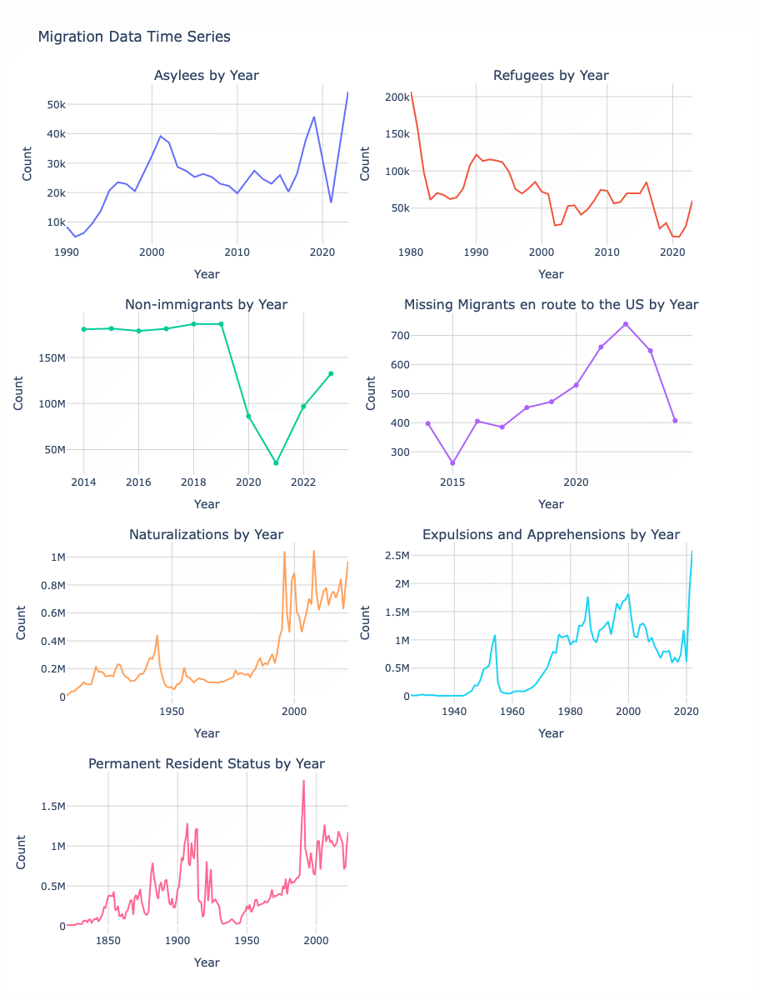

In [116]:
fig = make_subplots(rows=4, cols=2, shared_xaxes=False, vertical_spacing=0.08,
                    subplot_titles=("Asylees by Year", "Refugees by Year", "Non-immigrants by Year", 
                                    "Missing Migrants en route to the US by Year",
                                    "Naturalizations by Year", "Expulsions and Apprehensions by Year", "Permanent Resident Status by Year"))

def add_trace_with_years(fig, df, row, col):
    fig.add_trace(go.Scatter(x=df.index, y=df.iloc[:, 0]), row=row, col=col)
    fig.update_xaxes(row=row, col=col)

add_trace_with_years(fig, asyleesdf, 1, 1)
add_trace_with_years(fig, refugeesdf, 1, 2)
add_trace_with_years(fig, nonimdf, 2, 1)
add_trace_with_years(fig, missingmigdf, 2, 2)
add_trace_with_years(fig, naturalizedf, 3, 1)
add_trace_with_years(fig, enforcedf, 3, 2)
add_trace_with_years(fig, prdf, 4, 1)

fig.update_layout(
    height=1200, 
    width=1000, 
    title_text="Migration Data Time Series",
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend= False
)
fig.update_xaxes(title_text="Year", showgrid=True, gridcolor='lightgrey')
fig.update_yaxes(title_text="Count", showgrid=True, gridcolor='lightgrey')

fig.show()

**Conclusions**
* The number of asylees follows an increasing trend in general from 1990 to 2020, with very marked peaks around the years 2001 and 2019. In 2020, there was a sharp drop, probably due to COVID-19 restrictions, which then dramatically increased.
* Refugee admissions had reached a peak in the early 1980s, at about 200,000, followed by a general downward trend. In recent decades, the numbers have been fluctuating between 50,000 and 100,000, with a particularly steep drop in the late 2010s.
* Non-immigrant entries held steady at about 175M from 2014 through 2019, dropping precipitously during the COVID-19 pandemic in 2020. It shows a recovery trend from 2021 onwards.
* The number of migrants missing en route to the US has shown an increasing trend from 2014 to 2022, reaching a peak of approximately 650 in 2022. A sharp decline is seen in the most recent data point.
* Naturalization numbers have increased significantly since the 1950s, with dramatic spikes in the late 1990s and 2000s. In recent years, naturalizations have been highly variable with peaks reaching nearly 1 million naturalizations.
* There have been a number of major peaks in enforcement actions over time, with significant spikes in the 1950s and 1980s. The most recent years show an unprecedented surge, reaching 2.5M expulsions and apprehensions.
* Permanent resident status granted has seen quite a fluctuation since 1850, with noticeable peaks around 1900-1910 and an almost dramatic spike in the early 2000s. Recent years have shown sustained high levels of about 1 million per year.


#### Variations in Presidential Terms
We will now use a function *presidency_totals* that aggregates the data into the last three presidential terms (includes only the second term of the Obama Administration) into their respective dataframes. It needs to be noted that the data for President Biden's term isn't fully available, and we have marked the unavailability in the comments below. Our code caters to that missing data as well. It also needs to be noted that the legal non-immigrant and missing migrant data don't have data points from 2013, the first year of the second Obama term. We shall use bar graphs to adjudicate variations. We again use plotly to make the subplots and visualize, modifying properties using the *update_* functions.

In [120]:
def presidency_totals(df):
    obama_years = df.index[(df.index >= 2013) & (df.index <= 2016)]
    trump_years = df.index[(df.index >= 2017) & (df.index <= 2020)]
    biden_years = [2021, 2022, 2023,2024]  # Assuming Biden's presidency includes these years

    obama_totals = df.loc[obama_years].sum()
    trump_totals = df.loc[trump_years].sum()

    # Calculate totals for Biden (handling potential missing data)
    biden_totals = df.loc[df.index.isin(biden_years)].sum()

    new_df = pd.DataFrame({
        'Obama': obama_totals,
        'Trump': trump_totals,
        'Biden': biden_totals
    }).T

    return new_df


In [122]:
asylums = presidency_totals(asyleesdf) #Biden admin data until 2023
refugees = presidency_totals(refugeesdf) #Biden admin data until 2023
nonimmigrants = presidency_totals(nonimdf) #Biden admin data until 2023
missing = presidency_totals(missingmigdf)
naturalized = presidency_totals(naturalizedf) #Biden admin data until 2022
enforced = presidency_totals(enforcedf) #Biden admin data until 2022
prs = presidency_totals(prdf) #Biden admin data until 2023

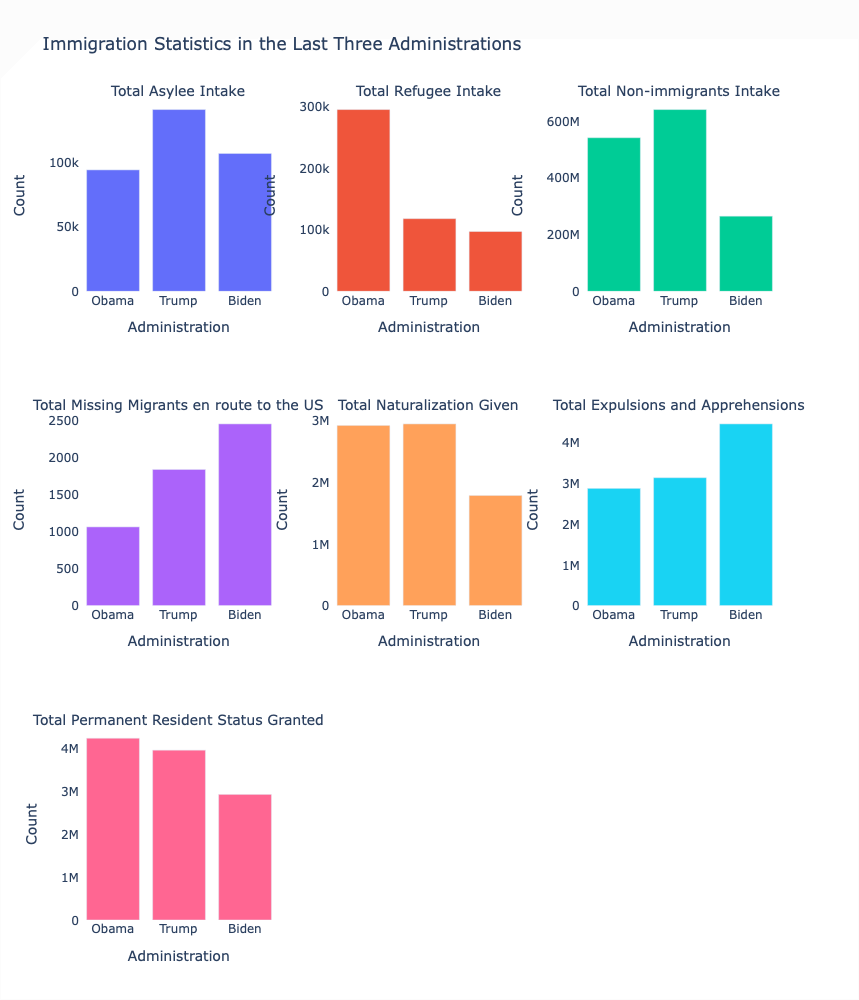

In [124]:
fig = make_subplots(rows=3, cols=3, 
                    subplot_titles=('Total Asylee Intake', 'Total Refugee Intake', 'Total Non-immigrants Intake', 
                                    'Total Missing Migrants en route to the US', 'Total Naturalization Given', 
                                    'Total Expulsions and Apprehensions', 'Total Permanent Resident Status Granted', 
                                    '', ''),  # Add empty strings for the last two subplots
                    vertical_spacing=0.15, 
                    horizontal_spacing=0.075)

dfs = [asylums, refugees, nonimmigrants, missing, naturalized, enforced, prs]

for i, df in enumerate(dfs):
    row = i // 3 + 1
    col = i % 3 + 1
    
    for column in df.columns:
        fig.add_trace(
            go.Bar(x=df.index, y=df[column], name=column, showlegend=False),
            row=row, col=col
        )
    
    fig.update_xaxes(title_text="Administration", row=row, col=col)
    fig.update_yaxes(title_text="Count", row=row, col=col)

fig.update_annotations(font_size=14)

fig.update_layout(height=1000, width=1200, title_text="Immigration Statistics in the Last Three Administrations",
                 plot_bgcolor='white',
    paper_bgcolor='white')


fig.show()

**Conclusions**
* The administration of Trump had the highest intake of asylees among the three administrations, almost doubling that of Obama. Biden's administration shows a slight decrease from Trump's peak but sustains higher levels than during Obama's era.
* The intake of refugees is drastically lower for both Trump and Biden compared to Obama, who accepted almost three times as many refugees. The trend from Obama's administration to Biden's is a consistent downward slope.
* Non-immigrant entries were highest during the Trump administration, at approximately 600M. There is a significant drop during Biden's administration, which may be due to COVID-19 pandemic restrictions.
* There is an alarming upward trend in missing migrants throughout all three administrations. Biden's administration has the highest numbers, more than doubling the count from Obama's era.
* Obama and Trump maintained similar levels of naturalization at around 3M. Biden's administration shows a notable decrease to about 2M, probably because of delays in processing and pandemic-related disruptions.
* In each successive administration, the number of enforcement actions has increased. For Biden's Administration, the number of expulsions and apprehensions is the highest, reaching over 4M in only two years.
* It is observed that permanent resident status has declined steadily across the three administrations. The numbers fell from about 4M during Obama's time to roughly 3M under Biden.


#### Statistical Analysis

We shall now answer some questions using statistics and look for correlations. For this, we will join the dataframes we are looking to correlate and find the correlation coefficient using the *corr()* function. We will also conduct some hypothesis testing.

**Question:** Is there a correlation between enforcement (expulsions and apprehensions) and total amnesty granted?

In [129]:
migrationdf = asyleesdf.join([refugeesdf,enforcedf], how='inner')
migrationdf['Total Amnesty'] = migrationdf['Asylees'] + migrationdf['Refugees']
migrationdf.drop(columns=['Asylees','Refugees'],inplace=True)
correlation = migrationdf['Total Amnesty'].corr(migrationdf['ExpulsionApprehension'])
correlation

0.018141052493070794

A value of 0.018 implies that there is virtually no linear relationship between Total Amnesty and Enforcement. This means that the removal of migrants is not contingent on the amnesty granted during the year.

**Question:** Is there a correlation between missing migrants and total amnesty granted?

In [133]:
missingcorr  = migrationdf.join([missingmigdf], how='inner')
correlation = missingcorr['Total Amnesty'].corr(missingcorr['Missing Migrants'])
correlation

-0.7344512816187833

A value of -0.73 implies that there is a strong negative relationship between Total Amnesty and Missing Migrants. This could potentially imply that during years when the number of missing migrants is high, the total amnesty is lower and vice-versa. We will be careful to not call this a causal relationship, as both of these events could be dependent on an external factor like a crisis in the migrant's region of origin.

**Question:** Does immigration pattern change during global crisis?

First we start with amnesties granted by the United States. In order to work through this, we first divide the crisis periods into two series, the first being the crisis dataframes (consisting of the economic crisis and covid crisis data) and the non-crisis period series. We then run a hypothesis test using sci-py stats, where the null hypothesis is set as:
*There is no significant difference in amnesty numbers during crisis periods.*

The two series are converted to float for analysis, and given as inputs to the *ttest_ind* function which yields a t-statistic value and a p-value. Using a significance level set at 0.05, we then compare the values to accept or reject the null hypothesis. 

In [137]:
economic_crisis = migrationdf[(migrationdf.index >= 2007) & (migrationdf.index <= 2009)]['Total Amnesty']
covid_crisis = migrationdf[migrationdf.index >= 2020]['Total Amnesty']
non_crisis = migrationdf[(migrationdf.index < 2007) | ((migrationdf.index > 2009) & (migrationdf.index < 2020))]['Total Amnesty']

crisis_periods = pd.concat([economic_crisis, covid_crisis])

crisis_periods = crisis_periods.astype(float)
non_crisis = non_crisis.astype(float)

t_statistic, p_value = stats.ttest_ind(crisis_periods, non_crisis)

print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")

alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference in amnesty numbers during crisis periods.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in amnesty numbers during crisis periods.")

T-statistic: -3.130245956473827
P-value: 0.003791031675687169
Reject the null hypothesis. There is a significant difference in amnesty numbers during crisis periods.


Following the same steps, we now observe changes in non-immigrants.

In [140]:
economic_crisis = nonimdf[(nonimdf.index >= 2007) & (nonimdf.index <= 2009)]['Legal Nonimmigrants']
covid_crisis = nonimdf[nonimdf.index >= 2020]['Legal Nonimmigrants']
non_crisis = nonimdf[(nonimdf.index < 2007) | ((nonimdf.index > 2009) & (nonimdf.index < 2020))]['Legal Nonimmigrants']

crisis_periods = pd.concat([economic_crisis, covid_crisis])

crisis_periods = crisis_periods.astype(float)
non_crisis = non_crisis.astype(float)

t_statistic, p_value = stats.ttest_ind(crisis_periods, non_crisis)

print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")

alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference in nonimmigrant numbers during crisis periods.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in nonimmigrant numbers during crisis periods.")

T-statistic: -5.940069592742949
P-value: 0.0003458073574280246
Reject the null hypothesis. There is a significant difference in nonimmigrant numbers during crisis periods.


Finally, we observe changes in numbers of missing migrants en route to the US. Due to the unavailability of data, we only use the COVID-19 period as a reference.

In [143]:
crisis_periods = missingmigdf[missingmigdf.index >= 2020]['Missing Migrants']
non_crisis = missingmigdf[(missingmigdf.index < 2007) | ((missingmigdf.index > 2009) & (missingmigdf.index < 2020))]['Missing Migrants']

crisis_periods = crisis_periods.astype(float)
non_crisis = non_crisis.astype(float)

t_statistic, p_value = stats.ttest_ind(crisis_periods, non_crisis)

print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")

alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference in missing migrant numbers during crisis periods.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference in missing migrant numbers during crisis periods.")

T-statistic: 3.2371867184167042
P-value: 0.0102045182000824
Reject the null hypothesis. There is a significant difference in missing migrant numbers during crisis periods.


**Conclusion:** We can see that the global crisis does influence the migration to the US. It could be said that conditions like lockdown or lack of financial capital during crisis made it hard for people to leave their homes. However, the number of missing migrants did increase during this period which shows that people resorted to desperate measures to move away from crisis.